In [ ]:
import numpy as np 
import pandas as pd 
import os 
import matplotlib.pyplot as plt

# 这是一些乱七八糟的测试工具和案例，可能会有用

In [ ]:
## Read sp3 files
def read_sp3(file_path, error=False, VL = True):
  """
  Reads an SP3 file and returns a DataFrame with the satellite positions.
  
  Parameters:
  file_path (str): Path to the SP3 file.
  
  Returns:
  pd.DataFrame: DataFrame containing satellite positions and times.
  """
  data = []
  with open(file_path, 'r') as f:
    for line in f:
      if line.startswith('*'):
        time = line[1:-1]
        time = pd.to_datetime(time, format='  %Y  %m  %d  %H  %M  %S.%f')
      else:
        data0 = line.strip().split()
        if data0[0].startswith('P'):
          sat_id = data0[0][2:]
          x = float(data0[1])
          y = float(data0[2])
          z = float(data0[3])
          dt = float(data0[4])
          if error:
            error_x = float(data0[5])
            error_y = float(data0[6])
            error_z = float(data0[7])
            error_dt = float(data0[8])
            if not VL:
              data.append([time, sat_id, x, y, z, dt, error_x, error_y, error_z, error_dt])
              continue
          elif not VL:
            data.append([time, sat_id, x, y, z, dt])
            continue

        elif VL and data0[0].startswith('V'):
          vx = float(data0[1])
          vy = float(data0[2])
          vz = float(data0[3])
          ddt = float(data0[4])
          if error:
            error_vx = float(data0[5])
            error_vy = float(data0[6])
            error_vz = float(data0[7])
            error_ddt = float(data0[8])
            data.append([time, sat_id, x, y, z, dt, vx, vy, vz, ddt, 
                          error_x, error_y, error_z, error_dt, 
                          error_vx, error_vy, error_vz, error_ddt])
          else:
            data.append([time, sat_id, x, y, z, dt, vx, vy, vz, ddt])
  if error and VL:
    df = pd.DataFrame(data, columns=['time', 'sat_id', 'x', 'y', 'z', 'dt',
                                    'vx', 'vy', 'vz', 'ddt',
                                    'error_x', 'error_y', 'error_z', 'error_dt',
                                    'error_vx', 'error_vy', 'error_vz', 'error_ddt'])
  elif not error and VL:
    df = pd.DataFrame(data, columns=['time', 'sat_id', 'x', 'y', 'z', 'dt',
                                    'vx', 'vy', 'vz', 'ddt'])
  elif error and not VL:
    df = pd.DataFrame(data, columns=['time', 'sat_id', 'x', 'y', 'z', 'dt',
                                    'error_x', 'error_y', 'error_z', 'error_dt'])
  else:
    df = pd.DataFrame(data, columns=['time', 'sat_id', 'x', 'y', 'z', 'dt'])
  return df

In [ ]:
## read my files
# kin_data = read_sp3('F:\\csu\\GNSS_dyf\\GNSS\\CSUAPPS\\CSUPODSApp\\BIN\\outputdata\\GFO_C\\BJ_JMDGSJ_0001_20200901010040_20200901230000_KIN.sp3',error=True)
# ekf_data = read_sp3('F:\\csu\\GNSS_dyf\\GNSS\\CSUAPPS\\CSUPODSApp\\BIN\\outputdata\\GFO_C\\BJ_JMDGSJ_0001_20200901010100_20200901230000_EKF.sp3',error=True)
# rdod_data = read_sp3('F:\\csu\\GNSS_dyf\\GNSS\\CSUAPPS\\CSUPODSApp\\BIN\\outputdata\\GFO_C\\BJ_JMDGSJ_0001_20200901010040_20200901230000_RDOD.sp3',error=True)

kin_data = read_sp3('F:\\csu\\GNSS_dyf\\GNSS\\CSUAPPS\\CSUPODSApp\\BIN\\outputdata\\GFO_D\\BJ_JMDGSJ_0001_20200901010040_20200901225350_KIN.sp3',error=True)
rdod_data = read_sp3('F:\\csu\\GNSS_dyf\\GNSS\\CSUAPPS\\CSUPODSApp\\BIN\\outputdata\\GFO_D\\BJ_JMDGSJ_0001_20200901010040_20200901225340_RDOD.sp3',error=True)

In [ ]:
## read true data
# orb_data = read_sp3('F:\\csu\\GFO-TEST\\ORB\\RDSCF202450.PRE')
# jpl_data = read_sp3('F:\\csu\\GFO-TEST\\JPL\\JPLC202450.PRE',VL=False)

orb_data = read_sp3('F:\\csu\\GFO-TEST\\ORB\\RDSDF202450.PRE')
jpl_data = read_sp3('F:\\csu\\GFO-TEST\\JPL\\JPLD202450.PRE',VL=False)

In [ ]:
# kin_data['sat_id'] = ['64'] * len(kin_data)
# ekf_data['sat_id'] = ['64'] * len(ekf_data)
# rdod_data['sat_id'] = ['64'] * len(rdod_data)

kin_data['sat_id'] = ['65'] * len(kin_data)
rdod_data['sat_id'] = ['65'] * len(rdod_data)

In [ ]:
def calculate_error(df1, df2, VL = True):
    """
    Calculate the error between two DataFrames containing satellite positions.
    
    Parameters:
    df1 (pd.DataFrame): First DataFrame with satellite positions.
    df2 (pd.DataFrame): Second DataFrame with satellite positions.
    
    Returns:
    pd.DataFrame: DataFrame containing the error between the two DataFrames.
    """
    merged = pd.merge(df1, df2, on=['time', 'sat_id'], suffixes=('_1', '_2'))
    # 若某一行存在Nan，则删除该行
    merged = merged.dropna(axis=0, how='any')
    print(merged.head(10))
    if merged.empty:
        print("No matching data found between the two DataFrames.")
        return pd.DataFrame()
    error = pd.DataFrame()
    error['time'] = merged['time']
    error['sat_id'] = merged['sat_id']
    error['error_x'] = (merged['x_1'] - merged['x_2'])*1000
    error['error_y'] = (merged['y_1'] - merged['y_2'])*1000
    error['error_z'] = (merged['z_1'] - merged['z_2'])*1000
    error['error_dt'] = (merged['dt_1'] - merged['dt_2'])*1000
    if not VL:
        return error
    if VL:
        error['error_vx'] = (merged['vx_1'] - merged['vx_2'])*1000
        error['error_vy'] = (merged['vy_1'] - merged['vy_2'])*1000
        error['error_vz'] = (merged['vz_1'] - merged['vz_2'])*1000
        error['error_ddt'] = merged['ddt_1'] - merged['ddt_2']
    return error

In [ ]:
error_kin_orb = calculate_error(kin_data, orb_data)
error_rdod_orb = calculate_error(rdod_data, orb_data)
# error_ekf_orb = calculate_error(ekf_data, orb_data)
error_kin_jpl = calculate_error(kin_data, jpl_data, VL=False)
error_rdod_jpl = calculate_error(rdod_data, jpl_data, VL=False)
# error_ekf_jpl = calculate_error(ekf_data, jpl_data, VL=False)

In [ ]:
def plot_error(df, name1, name2):
  if_v = ('error_vx' in df.columns)
  if_dt = (np.abs(df['error_dt'].mean())<100)
  if if_v:
    plt.figure(figsize=(10, 6))
    plt.plot(df['time'], df['error_x'], label='Error X')
    plt.plot(df['time'], df['error_y'], label='Error Y')
    plt.plot(df['time'], df['error_z'], label='Error Z')
    plt.xlabel('Time')
    plt.ylabel('Error')
    plt.title(f'{name1} - {name2} Position Error')
    plt.legend()
    plt.savefig(f'{name1}_{name2}_position_error.png')
    
    plt.figure(figsize=(10, 6))
    plt.plot(df['time'], df['error_vx'], label='Error Vx')
    plt.plot(df['time'], df['error_vy'], label='Error Vy')
    plt.plot(df['time'], df['error_vz'], label='Error Vz')
    plt.xlabel('Time')
    plt.ylabel('Error')
    plt.title(f'{name1} - {name2} Velocity Error')
    plt.legend()
    # plt.savefig(f'{name1}_{name2}_velocity_error.png')

  else:
    plt.figure(figsize=(10, 6))
    plt.plot(df['time'], df['error_x'], label='Error X')
    plt.plot(df['time'], df['error_y'], label='Error Y')
    plt.plot(df['time'], df['error_z'], label='Error Z')
    plt.xlabel('Time')
    plt.ylabel('Error')
    plt.title(f'{name1} - {name2} Position Error')
    plt.legend()
    # plt.savefig(f'{name1}_{name2}_position_error.png')

In [ ]:
# plot_error(error_kin_orb, 'KIN', 'ORB')
plot_error(error_rdod_orb, 'RDOD', 'ORB')
# plot_error(error_ekf_orb, 'EKF', 'ORB')
# plot_error(error_kin_jpl, 'KIN', 'JPL')
plot_error(error_rdod_jpl, 'RDOD', 'JPL')
# plot_error(error_ekf_jpl, 'EKF', 'JPL')

In [ ]:
error_x_test = error_kin_orb['error_x']
time0 = error_kin_orb.iloc[error_x_test.argmax()][0]
print(time0)
print(kin_data[kin_data['time'] == time0])
print(orb_data[orb_data['time'] == time0])

In [ ]:
## deal with log data
def DataEditingLog(filepath):
  sat_num_df = []
  with open(filepath, 'r', encoding='GB2312') as file:
    start = False
    for line in file:
      if line.startswith('RejectObsData'):
        start = True
        continue
      if start and not line.startswith('20'):
        break
      if not start:
        continue
      lines = line.split(',')
      time0 = lines[0]
      time0 = pd.to_datetime(time0, format='%Y:%m:%d %H:%M:%S')
      elipse = float(lines[1].split('=')[-1])
      sat_num0 = int(lines[2][-1])
      sat_num1 = int(lines[3][-1])
      sat_num2 = int(lines[4][-2])
      sat_num_df.append([time0, elipse, sat_num0, sat_num1, sat_num2])   
  file.close()
  sat_num_df = pd.DataFrame(sat_num_df, columns=['time', 'elipse', 'sat_num0', 'sat_num1', 'sat_num2'])
  print(sat_num_df)
  plt.figure(figsize=(10, 6))
  plt.plot(sat_num_df['time'], sat_num_df['sat_num0'], label='Sat Num Before Code Editing')
  plt.plot(sat_num_df['time'], sat_num_df['sat_num1'], label='Sat Num After Code Editing')
  plt.plot(sat_num_df['time'], sat_num_df['sat_num2'], label='Sat Num After Phase Editing')
  plt.xlabel('Time')
  plt.ylabel('Satellite Number')
  plt.title('Satellite Number Change During Data Editing')
  plt.legend()
DataEditingLog('F:\\csu\\GNSS_dyf\\GNSS\\CSUAPPS\\CSUPODSApp\\BIN\\LOG\\GFO_D\\GFO_D_Editing_Log_20200901.log')

In [ ]:
def SPP_info(file_path):
  spp_info = pd.read_csv(file_path, encoding='GB2312',skiprows=1,header=None, sep=',')
  columns = ['year','month','day','hour','minute','second','starttime','sat_num','precision','pdop','na']
  spp_info.columns = columns
  spp_info['time'] = pd.to_datetime(spp_info[['year', 'month', 'day', 'hour', 'minute', 'second']])
  spp_info.drop(['starttime','na','year', 'month', 'day', 'hour', 'minute', 'second'],axis=1, inplace=True)
  spp_info['sat_num'] = spp_info['sat_num'].astype(int)
  print(spp_info.head())

  plt.figure(figsize=(10, 6))
  plt.plot(spp_info['time'], spp_info['sat_num'], label='Satellite Number')
  plt.xlabel('Time')
  plt.ylabel('Satellite Number')
  plt.title('Satellite Number in SPP Info')
  plt.legend()
  
  plt.figure(figsize=(10, 6))
  plt.plot(spp_info['time'], spp_info['precision'], label='Precision')
  plt.xlabel('Time')
  plt.ylabel('Precision')
  plt.title('Precision in SPP Info')
  plt.legend()
  
  plt.figure(figsize=(10, 6))
  plt.plot(spp_info['time'], spp_info['pdop'], label='PDOP')
  plt.xlabel('Time')
  plt.ylabel('PDOP')
  plt.title('PDOP in SPP Info')
  plt.legend()
SPP_info("F:\\csu\\GNSS_MIX\\CSUAPPS\\CSUPODSApp\\BIN\\LOG\\GFO_C\\GFO_C_SPP_Info_20200901.dat")

In [ ]:
def Dynamic_info(file_path):
  df = pd.read_csv(file_path,  header=None, sep=',')
  columns = ['year', 'month', 'day', 'hour', 'minute', 'second','starttime', 'EstCd', 'EstCr', 'BiasX', 'BiasY', 'BiasZ', 'EmpirAccX', 'EmpirAccY', 'EmpirAccZ', 'na']
  # Bias是径向、切向和法向的偏置力，EmprirAcc是三轴经验加速度，Cd Cr引力拉力和辐射压力
  df.columns = columns
  df['time'] = pd.to_datetime(df[['year', 'month', 'day', 'hour', 'minute', 'second']])
  df.drop(['year', 'month', 'day', 'hour', 'minute', 'second', 'na', 'starttime'], axis=1, inplace=True)
  
  print(df.head())
  plt.figure(figsize=(10, 6))
  plt.plot(df['time'], df['EstCd'], label='Estimated Cd')
  plt.plot(df['time'], df['EstCr'], label='Estimated Cr')
  plt.xlabel('Time')
  plt.ylabel('Estimated C')
  plt.title('Estimated Cd and Cr Over Time')
  plt.legend()

  plt.figure(figsize=(10, 6))
  plt.plot(df['time'], df['BiasX'], label='Bias X')
  plt.plot(df['time'], df['BiasY'], label='Bias Y')
  plt.plot(df['time'], df['BiasZ'], label='Bias Z')
  plt.xlabel('Time')
  plt.ylabel('Bias')
  plt.title('Bias Over Time')
  plt.legend()

  plt.figure(figsize=(10, 6))
  plt.plot(df['time'], df['EmpirAccX'], label='Empirical Acceleration X')
  plt.plot(df['time'], df['EmpirAccY'], label='Empirical Acceleration Y')
  plt.plot(df['time'], df['EmpirAccZ'], label='Empirical Acceleration Z')
  plt.xlabel('Time')
  plt.ylabel('Empirical Acceleration')
  plt.title('Empirical Acceleration Over Time')
  plt.legend()

Dynamic_info("F:\\csu\\GNSS_MIX\\CSUAPPS\\CSUPODSApp\\BIN\LOG\\GFO_C\\GFO_C_DynFit_Dyn_20200901.dat")

In [ ]:
def Dynamic_info_EKF(file_path):
  df = pd.read_csv(file_path,  header=None, sep=',')
  columns = ['year', 'month', 'day', 'hour', 'minute', 'second','starttime', 'EstCd', 'EstCr', 'EmpirAccX', 'EmpirAccY', 'EmpirAccZ', 'na']
  # EmprirAcc是三轴经验加速度，Cd Cr引力拉力和辐射压力
  df.columns = columns
  df['time'] = pd.to_datetime(df[['year', 'month', 'day', 'hour', 'minute', 'second']])
  df.drop(['year', 'month', 'day', 'hour', 'minute', 'second', 'na', 'starttime'], axis=1, inplace=True)
  
  print(df.head())
  plt.figure(figsize=(10, 6))
  plt.plot(df['time'], df['EstCd'], label='Estimated Cd')
  plt.plot(df['time'], df['EstCr'], label='Estimated Cr')
  plt.xlabel('Time')
  plt.ylabel('Estimated C')
  plt.title('Estimated Cd and Cr Over Time')
  plt.legend()

  plt.figure(figsize=(10, 6))
  plt.plot(df['time'], df['EmpirAccX'], label='Empirical Acceleration X')
  plt.plot(df['time'], df['EmpirAccY'], label='Empirical Acceleration Y')
  plt.plot(df['time'], df['EmpirAccZ'], label='Empirical Acceleration Z')
  plt.xlabel('Time')
  plt.ylabel('Empirical Acceleration')
  plt.title('Empirical Acceleration Over Time')
  plt.legend()

Dynamic_info_EKF("F:\\csu\\GNSS_dyf\\GNSS\\CSUAPPS\\CSUPODSApp\\BIN\LOG\\GFO_C\\GFO_C_EKF_Dyn_20200901.dat")

In [ ]:
def ResData(filepath):
  data = []
  with open(filepath, 'r') as f:
    for line in f:
      line = line.replace(' ','')
      lines = line.split(',')
      time0 = lines[0]+'-'+lines[1]+'-'+lines[2]+' '+lines[3]+':'+lines[4]+':'+lines[5]
      time0 = pd.to_datetime(time0, format='%Y-%m-%d %H:%M:%S')
      sat_num = int(lines[7])
      for i in range(sat_num):
        sat_id = lines[8+i*5]
        ele = float(lines[9+i*5])
        azi = float(lines[10+i*5])
        prefitL = float(lines[11+i*5])
        prefitC = float(lines[12+i*5])
        data.append({'time': time0, 'sat_id': sat_id, 'ele': ele, 'azi': azi, 'prefitL': prefitL, 'prefitC': prefitC})
    data = pd.DataFrame(data)
    
ResData("F:\\csu\\GNSS_dyf\\GNSS\\CSUAPPS\\CSUPODSApp\\BIN\LOG\\GFO_C\\GFO_C_RDOD_Res_20200901.dat")

In [ ]:
import Rinex
import os
input_rinex2 = "F:\\csu\\GFO-TEST\\OBS\\GFDN2450.20O"
output_rinex3 = "F:\\csu\\GFO-TEST\\OBS\\GFDN2450_edited.30O"
def convert_rinex2_to_rinex3(input_file, output_file):
    ## input: Rinex2 obs file path, and output Rinex3 obs file path
    if not Rinex.is_obs(input_file):
        raise ValueError("The input file is not a valid RINEX observation file.")
    obs_head = Rinex.readObsHead(input_file)
    obs_data = Rinex.readObs(input_file, obs_head)
    Rinex.writeObs(obs_head,obs_data,output_file)
convert_rinex2_to_rinex3(input_rinex2, output_rinex3)

In [ ]:
# import pandas as pd 
# import Sp3Tools
# my_c = Sp3Tools.SP3('F:\\csu\\GNSS_dyf\\GNSS\\CSUAPPS\\CSUPODSApp\\BIN\\outputdata\\GFO_C\\BJ_JMDGSJ_0001_20200901101410_20200901175950_RDOD.sp3')
# my_d = Sp3Tools.SP3('F:\\csu\\GNSS_dyf\\GNSS\\CSUAPPS\\CSUPODSApp\\BIN\\outputdata\\GFO_D\\BJ_JMDGSJ_0001_20200901100040_20200901175940_RDOD.sp3')
# jpl_c = Sp3Tools.SP3("F:\\csu\\GNSS_dyf\\GNSS\\CSUAPPS\\CSUPODSApp\\BIN\\outputdata\\GFO_C\\JPLC202450.PRE")
# jpl_d = Sp3Tools.SP3("F:\\csu\\GNSS_dyf\\GNSS\\CSUAPPS\\CSUPODSApp\\BIN\\outputdata\\GFO_D\\JPLD202450.PRE")
# my_c_df = my_c.asDataFrame()
# my_d_df = my_d.asDataFrame()
# jpl_c_df = jpl_c.asDataFrame()
# jpl_d_df = jpl_d.asDataFrame()
# my_c_df.drop(columns=['sat_id','clk','vx','vy','vz','vclk'],inplace=True)
# my_d_df.drop(columns=['sat_id','clk','vx','vy','vz','vclk'],inplace=True)
# jpl_c_df.drop(columns=['sat_id','clk'],inplace=True)
# jpl_d_df.drop(columns=['sat_id','clk'],inplace=True)

sp3_diff1 ={
    "root_path": "F:\\csu\\GNSS_dyf\\GNSS\\CSUAPPS\\CSUPODSApp\\BIN",
    "sp3_file_1" : "outputdata\\GFO_C\\BJ_JMDGSJ_0001_20200901101410_20200901175950_RDOD.sp3",
    "sp3_file_2" : "outputdata\\GFO_D\\BJ_JMDGSJ_0001_20200901100040_20200901175940_RDOD.sp3",
    "output_path" : "analysis\\diff\\",
    "POD_type" : "my",
    "satellite" : "my_c - my_d",
    "save_csv" : True}

sp3_diff2 = {
    "root_path": "F:\\csu\\GNSS_dyf\\GNSS\\CSUAPPS\\CSUPODSApp\\BIN",
    "sp3_file_1" : "outputdata\\GFO_C\\JPLC202450.PRE",
    "sp3_file_2" : "outputdata\\GFO_D\\JPLD202450.PRE",
    "output_path" : "analysis\\diff\\",
    "POD_type" : "jpl",
    "satellite" : "jpl",
    "save_csv" : True
}
import analysis 
diff1 = analysis.compute_sp3_diff(sp3_diff1)
diff2 = analysis.compute_sp3_diff(sp3_diff2)

diff = pd.merge(diff1, diff2, on='time', suffixes=('_my', '_jpl'))
diff['error_x'] = diff['x_err_my'] - diff['x_err_jpl']
diff['error_y'] = diff['y_err_my'] - diff['y_err_jpl']
diff['error_z'] = diff['z_err_my'] - diff['z_err_jpl']
diff.to_csv('diff.csv')
print(diff.head())

In [ ]:
import Rinex
import pandas as pd
obs_head = Rinex.readObsHead("F:\\csu\\GNSS_dyf\\GNSS\\CSUAPPS\\CSUPODSApp\\BIN\,empData\\GFO_D\\GFO_D_PreProcess_Obs_20200901.rnx")
obs_data = Rinex.readObs("F:\\csu\\GNSS_dyf\\GNSS\\CSUAPPS\\CSUPODSApp\\BIN\,empData\\GFO_D\\GFO_D_PreProcess_Obs_20200901.rnx", obs_head)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict
from matplotlib.dates import DateFormatter

def visualize_cycle_slips(obs_data, band='CSI', name='Clycle Slip'):
    """
    可视化周跳数据
    :param obs_data: 三维数据结构 obs_data[epoch][prn][band] -> value
    """
    # 1. 准备数据
    slip_events = []  # 存储周跳事件 (epoch, prn)
    satellite_slip_count = defaultdict(int)  # 各卫星周跳总次数
    epoch_slip_count = defaultdict(int)  # 各历元周跳总次数
    
    # 遍历所有历元
    for epoch, satellites in obs_data.items():
        for prn, bands in satellites.items():
            # 检查CS波段是否存在且值为1（发生周跳）
            if band in bands and bands[band] == 1:
                slip_events.append((epoch, prn))
                satellite_slip_count[prn] += 1
                epoch_slip_count[epoch] += 1
    
    # 如果没有周跳数据则返回
    if not slip_events:
        print("未检测到{name}事件")
        return
    
    # 2. 创建可视化图表
    plt.figure(figsize=(15, 10))
    
    # 子图1：周跳时间分布热力图
    plt.subplot(2, 1, 1)
    
    # 准备热力图数据
    prns = sorted(set(prn for _, prn in slip_events))
    epochs = sorted(set(epoch for epoch, _ in slip_events))
    
    # 创建二维数组表示周跳发生情况
    heatmap_data = np.zeros((len(prns), len(epochs)))
    
    for epoch, prn in slip_events:
        prn_idx = prns.index(prn)
        epoch_idx = epochs.index(epoch)
        heatmap_data[prn_idx, epoch_idx] = 1
    
    # 绘制热力图
    sns.heatmap(heatmap_data, cmap="YlGnBu", 
                xticklabels=len(epochs)//20,  # 每20个历元显示一个标签
                yticklabels=prns,
                cbar=False)
    
    plt.title(name, fontsize=14)
    plt.xlabel('Time')
    plt.ylabel('Sat')
    
    # 子图2：卫星周跳统计
    plt.subplot(2, 2, 3)
    
    # 按周跳次数排序
    sorted_satellites = sorted(satellite_slip_count.items(), 
                              key=lambda x: x[1], reverse=True)
    satellites, counts = zip(*sorted_satellites)
    
    # 绘制柱状图
    plt.bar(satellites, counts, color='skyblue')
    #plt.title('各卫星周跳次数统计', fontsize=12)
    plt.xlabel('Sat')
    plt.ylabel(name+' Count')
    plt.xticks(rotation=45)
    
    # 子图3：时间序列周跳频率
    plt.subplot(2, 2, 4)
    
    # 准备时间序列数据
    sorted_epochs = sorted(epoch_slip_count.keys())
    slip_counts = [epoch_slip_count[epoch] for epoch in sorted_epochs]
    
    # 绘制折线图
    plt.plot(sorted_epochs, slip_counts, 'r-')
    #plt.title('周跳时间序列', fontsize=12)
    plt.xlabel('Time')
    plt.ylabel(name+' Count')
    
    # 如果历元是datetime对象，格式化时间轴
    if isinstance(sorted_epochs[0], np.datetime64):
        plt.gca().xaxis.set_major_formatter(DateFormatter("%H:%M"))
    
    plt.tight_layout()
    plt.show()


visualize_cycle_slips(obs_data, band='CSI', name='Clycle Slip')
visualize_cycle_slips(obs_data, band='CGP', name='Code Error')
visualize_cycle_slips(obs_data, band='LGI', name='Phase Error')

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.dates as mdates
from collections import defaultdict

def visualize_observation_arcs(obs_data):
    """
    可视化GNSS卫星观测弧段
    :param obs_data: 三维数据结构 obs_data[epoch][prn][band] -> value
    """
    # 1. 准备数据
    arc_data = defaultdict(list)  # {prn: [(epoch, arc_value), ...]}
    
    # 遍历所有历元
    for epoch, satellites in obs_data.items():
        for prn, bands in satellites.items():
            if 'AR' in bands:  # 确保有AR字段
                arc_value = bands['AR']
                arc_data[prn].append((epoch, arc_value))
    
    # 如果没有弧段数据则返回
    if not arc_data:
        print("未检测到弧段数据")
        return
    
    # 2. 创建可视化图表
    fig, ax = plt.subplots(figsize=(15, 8))
    
    # 为每个卫星创建弧段图
    for i, (prn, data) in enumerate(arc_data.items()):
        # 按时间排序
        data.sort(key=lambda x: x[0])
        epochs, arc_values = zip(*data)
        
        # 创建线段集合（不同弧段用不同颜色）
        points = np.array([mdates.date2num(epochs), np.full(len(epochs), i)]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
        
        # 创建颜色映射
        unique_arcs = sorted(set(arc_values))
        cmap = ListedColormap(plt.cm.tab20(np.linspace(0, 1, len(unique_arcs))))
        norm = BoundaryNorm(np.arange(len(unique_arcs)+1)-0.5, cmap.N)
        
        # 为每个点分配颜色（基于弧段值）
        arc_indices = [unique_arcs.index(av) for av in arc_values]
        lc = LineCollection(segments, cmap=cmap, norm=norm)
        lc.set_array(np.array(arc_indices))
        lc.set_linewidth(2)
        
        # 添加到图表
        line = ax.add_collection(lc)
    
    # 设置图表属性
    ax.set_xlim(min(epochs), max(epochs))
    ax.set_ylim(-1, len(arc_data))
    
    # 设置Y轴为卫星PRN
    ax.set_yticks(range(len(arc_data)))
    ax.set_yticklabels(arc_data.keys())
    
    # 设置X轴为时间
    ax.xaxis_date()
    date_format = mdates.DateFormatter('%H:%M:%S')
    ax.xaxis.set_major_formatter(date_format)
    fig.autofmt_xdate()
    
    # 添加标题和标签
    plt.title('GNSS Sat Arc', fontsize=14)
    plt.xlabel('Time', fontsize=12)
    plt.ylabel('Sat', fontsize=12)
    
    # 添加图例
    # from matplotlib.lines import Line2D
    # legend_elements = [Line2D([0], [0], color=cmap(i), lw=2, 
    #                           label=f'arc {arc}') 
    #                    for i, arc in enumerate(unique_arcs)]
    # ax.legend(handles=legend_elements, title='arc', loc='upper right')
    
    plt.tight_layout()
    plt.show()

# 示例数据结构
# obs_data = {
#     datetime(2023, 5, 1, 0, 0): {
#         'G01': {'L1': 123.45, 'L2': 98.76, 'AR': 1},
#         'G02': {'L1': 234.56, 'L2': 187.65, 'AR': 1}
#     },
#     datetime(2023, 5, 1, 0, 30): {
#         'G01': {'L1': 123.48, 'L2': 98.79, 'AR': 1},
#         'G03': {'L1': 345.67, 'L2': 276.54, 'AR': 2}
#     },
#     datetime(2023, 5, 1, 1, 0): {
#         'G01': {'L1': 123.50, 'L2': 98.81, 'AR': 2},
#         'G02': {'L1': 234.60, 'L2': 187.70, 'AR': 1}
#     }
# }
# 将None替换为0
obs_data = {epoch: {prn: {k: (v if v is not None else 0) for k, v in bands.items()}
            for prn, bands in satellites.items()}
            for epoch, satellites in obs_data.items()}
# 调用可视化函数
visualize_observation_arcs(obs_data)

RES: 年 月 日 时 分 秒 starttime 卫星数 卫星id ele azi prefitL载波相位残差 prefitC伪距残差

In [ ]:
import pandas as pd
import numpy as np
r = np.array([-2732.985618,1912.913406,-6006.973719])
v = np.array([-1.641541,3.073992,2.210912])
r = r/np.linalg.norm(r)
v = v/np.linalg.norm(v)
er = r 
en = np.cross(r,v)
etau = np.cross(er,en)

R_matrix = np.vstack((er,en,etau)).T
# from ecef to orbital-dynamic
print(R_matrix)


print(R_matrix.T @ er)




In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.linalg as la

import Rinex
obsA_path = "D:\\csu\\GNSS_MIX\\CSUAPPS\\CSUPODSApp\\BIN\\inputdata\\Obs\\Diff\\GFO_C_DataEditing_Obs_20200901.rnx"
obsB_path = "D:\\csu\\GNSS_MIX\\CSUAPPS\\CSUPODSApp\\BIN\\inputdata\\Obs\\Diff\\GFO_D_DataEditing_Obs_20200901.rnx"

obsA_head = Rinex.readObsHead(obsA_path)
obsA_data = Rinex.readObs(obsA_path, obsA_head)
obsB_head = Rinex.readObsHead(obsB_path)
obsB_data = Rinex.readObs(obsB_path, obsB_head)
print(obsA_head)
obsA_keys = list(obsA_data.keys())

GPS_f1 = 1575.42e6
GPS_f2 = 1227.60e6
LIGHT_SPEED = 299792458.0
GPS_LAMBDA1 = LIGHT_SPEED / GPS_f1
GPS_LAMBDA2 = LIGHT_SPEED / GPS_f2
print(GPS_LAMBDA1, GPS_LAMBDA2)
k = GPS_f1**2/GPS_f2**2

AMat = np.matrix([[1, 1, 0, 0],
                  [1, k, 0, 0],
                  [1,-1,GPS_LAMBDA1, 0],
                  [1, -k,0, GPS_LAMBDA2]])

for epoch in range(3):
    obsA0 = obsA_data[obsA_keys[epoch]]
    obsB0 = obsB_data[obsA_keys[epoch]]
    sats = list(obsA0.keys())
    obs_type = list(obsA0[sats[0]].keys())

    XMAT = np.matrix([])
    for sat in sats:
        p1a = obsA0[sat].get('C1C', np.nan)
        p1b = obsB0[sat].get('C1C', np.nan)
        p2a = obsA0[sat].get('C2P', np.nan)
        p2b = obsB0[sat].get('C2P', np.nan)
        l1a = obsA0[sat].get('L1C', np.nan)
        l1b = obsB0[sat].get('L1C', np.nan)
        l2a = obsA0[sat].get('L2P', np.nan)
        l2b = obsB0[sat].get('L2P', np.nan)
        p1ab = p1b - p1a
        p2ab = p2b - p2a
        l1ab = l1b - l1a
        l2ab = l2b - l2a
        b = np.matrix([[p1ab], [p2ab], [l1ab], [l2ab]])
        x = la.solve(AMat, b)
        if x[-1,0] < 0:
            x = -x
        XMAT = np.hstack((XMAT, x)) if XMAT.size else x

    XMAT_df = pd.DataFrame(XMAT.T, columns=['dT', 'dI', 'dN1', 'dN2'], index=sats)
    print(XMAT_df)





In [ ]:
C = 299792458.0
L1_freq = 1575.42e6
L2_freq = 1227.60e6
L1_lambda = C / L1_freq
L2_lambda = C / L2_freq
import numpy as np
def conv(str):
    str_list = str.split('\t')
    float_list = [float(i) for i in str_list]
    return float_list
obsA = [22941210.633, 22941210.350, 120556872.097, 93940416.639]
obsB = [22832785.323, 22832784.880, 119987093.012, 93496425.220]
state = conv('9.009794e+04	-1.160279e+05	-8.614338e+04	-5.578874e+01	7.681411e+01	-1.630811e+02	0.000000e+00	0.000000e+00	0.000000e+00	0.000000e+00	0.000000e+00	-2.718309e+00	-3.071028e-01	1.358477e-01	-3.900712e-02	-6.859166e-02	8.428185e-02	-4.834378e-01	-4.540709e-02	3.920208e+00	-2.003129e+00	6.435452e-01	1.022368e+00	3.276171e-01	1.147737e+00	-1.118678e-01	9.905974e+00	5.795639e+00	8.390456e+00	8.763289e+00	8.095189e+00	1.052789e+01	6.621946e+00')
nsat = 7
satindex = 1
C1AB = obsB[0] - obsA[0]
P2AB = obsB[1] - obsA[1]
L1AB = (obsB[2] - obsA[2]) * L1_lambda 
L2AB = (obsB[3] - obsA[3]) * L2_lambda
IAB = state[12+satindex]
amb1 = state[12 + nsat + satindex] * L1_lambda
amb2 = state[12 + nsat *2 + satindex] * L2_lambda
print("C1AB:", C1AB)
print("P2AB:", P2AB)
print(L1AB - C1AB + 2 * IAB, amb1 )
print(L2AB - P2AB + 2 * IAB * (L1_lambda / L2_lambda)**2, amb2)


In [ ]:
(L1_freq/L2_freq)**2

In [ ]:
import navpy
import numpy as np
lla = [39.983238, 116.306739, 0]
ecef = navpy.lla2ecef(39.983238, 116.306739, 0, latlon_unit='deg', alt_unit='m')
print(ecef)

In [ ]:
X0 = np.array([ -730000, -5440000, 3230000, 0])

P1 = np.array([ 15524471.175,-16649826.222, 13512272.397])
P2 = np.array([ -2304058.534,-23287906.465,11917038.105])
P3 = np.array([ 16680243.357,-3069625.561,20378551.047])
P = [P1, P2, P3]
RHO = np.array([22274133.863, 19920232.728, 24566287.852])
while True:
    P0 = X0[0:3]
    lla0 = navpy.ecef2lla(P0)
    lla0_rad = [np.deg2rad(lla0[0]), np.deg2rad(lla0[1]), lla0[2]]
    rho = []
    for i in range(len(P)):
        rho_i = np.linalg.norm(P[i]-P0)
        rho.append(rho_i)
        # print(f"Computed range to satellite {i+1}: {rho_i} m, Given RHO: {RHO[i]} m, Difference: {rho_i - RHO[i]} m")
    G_mat = []
    for i in range(len(P)):
        diff = P0 - P[i]
        dist = rho[i]
        G_row = diff / dist
        G_row = G_row.tolist()
        G_row.append(1)
        G_mat.append(G_row)
    G_row = [np.cos(lla0_rad[0]) * np.cos(lla0_rad[1]),
            np.cos(lla0_rad[0]) * np.sin(lla0_rad[1]),
            np.sin(lla0_rad[0]),
            0]
    G_mat.append(G_row)
    G_mat = np.array(G_mat)
    # print("G matrix:")
    # print(G_mat)
    print(G_mat.shape)

    delta_rho = RHO - np.array(rho)
    delta_rho = np.append(delta_rho, 0)  # add zero for clock bias equation
    A = np.linalg.inv(G_mat.T @ G_mat) @ G_mat.T
    delta_x = A @ delta_rho
    print("Position correction (dx, dy, dz, dT):")
    print(delta_x)
    X0 = X0 + delta_x
    if np.linalg.norm(delta_x[:3])<1:
        break



In [6]:
import pandas as pd
import numpy as np
import AttitudeModel
file1="D:\\csu\\GNSS_MIX\\CSUAPPS\\CSUPODSApp\\BIN\\inputdata\\Spacecraft\\Diff\\GFCN_20202450.ATT"
file2 = "D:\\csu\\GNSS_MIX\\CSUAPPS\\CSUPODSApp\\BIN\\inputdata\\Spacecraft\\Diff\\GFDN_20202450.ATT"
att1 = AttitudeModel.read_attitude_file(file1)
att2 = AttitudeModel.read_attitude_file(file2)
for i in range(len(att1)):
    time1 = att1.loc[i, 'timesystem']
    time2 = att2.loc[i, 'timesystem']
    att1_R = att1.loc[i,'attitude'].get_rotation_matrix()
    att2_R = att2.loc[i,'attitude'].get_rotation_matrix()
    print(att1_R@att2_R.T)

d:\csu\MyTools\AttitudeModel.py:45: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  tmpdata = pd.read_csv(filepath, delim_whitespace=True, header=None,
d:\csu\MyTools\AttitudeModel.py:45: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  tmpdata = pd.read_csv(filepath, delim_whitespace=True, header=None,


[[-0.88341031 -0.16431215  0.4388482 ]
 [-0.16442823 -0.76826802 -0.61864982]
 [ 0.43880472 -0.61868067  0.65167833]]
[[-0.88281425 -0.16511963  0.43974369]
 [-0.16523029 -0.76718358 -0.61978085]
 [ 0.43970212 -0.61981034  0.64999783]]
[[-0.88221684 -0.16592852  0.44063723]
 [-0.16603404 -0.76609741 -0.62090858]
 [ 0.44059748 -0.62093679  0.64831425]]
[[-0.88161848 -0.16673858  0.44152814]
 [-0.16683943 -0.76500917 -0.62203342]
 [ 0.44149004 -0.62206046  0.64662765]]
[[-0.88101897 -0.16754993  0.44241677]
 [-0.16764661 -0.76391883 -0.62315538]
 [ 0.44238014 -0.62318138  0.6449378 ]]
[[-0.88041826 -0.16836271  0.44330315]
 [-0.16845516 -0.76282692 -0.62427393]
 [ 0.44326803 -0.62429887  0.64324519]]
[[-0.87981602 -0.16917706  0.44418791]
 [-0.16926532 -0.76173354 -0.62538889]
 [ 0.44415428 -0.62541277  0.64154956]]
[[-0.87921255 -0.16999334  0.44507029]
 [-0.17007691 -0.76063785 -0.62650132]
 [ 0.44503836 -0.626524    0.6398504 ]]
[[-0.87860772 -0.17081099  0.44595076]
 [-0.17089054 -0.

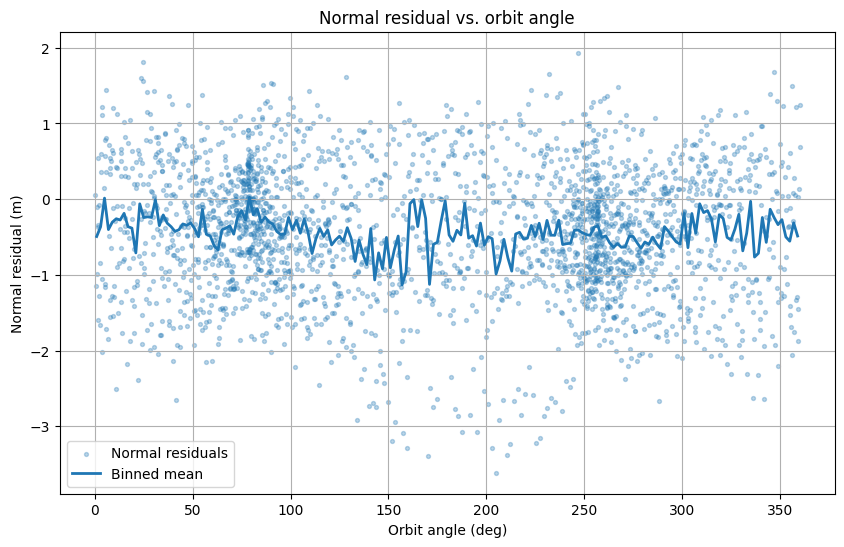

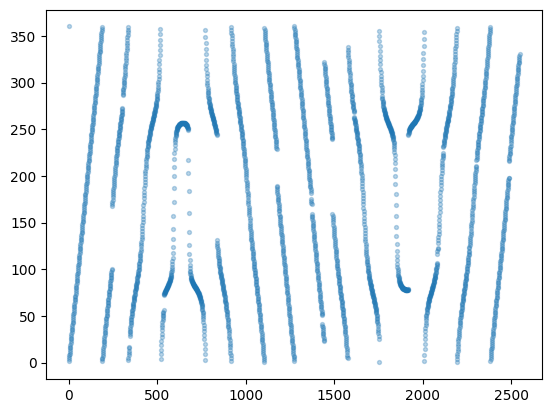

In [40]:
import numpy as np
import pandas as pd 
import Sp3Tools
import matplotlib.pyplot as plt
import TimeSystem

sp3 = Sp3Tools.SP3(r"D:\csu\GNSS_MIX\CSUAPPS\CSUPODSApp\BIN\outputdata\Diff\GFO_C_smooth_rts.sp3")
sp3_df = sp3.asDataFrame()
res_df = pd.read_csv(r"new\dataedit_test_rts_1_RTN_twoway\RTS_Position_Residuals.csv")
sp3_df['time'] = sp3_df['timesystem']
for i in range(len(res_df)):
    tmpTime = TimeSystem.TimeSystem()
    tmpTime.from_str(res_df.loc[i, 'Time'])
    res_df.loc[i, 'time'] = tmpTime

merged_df = pd.merge(sp3_df, res_df, on='time', suffixes=('_sp3', '_res'))
merged_df = merged_df[['time', 'x', 'y', 'z', 'vx', 'vy', 'vz', 'Radial', 'Transverse', 'Normal']].copy()

# 参考轨道面法向：建议用第一个历元，或者全弧平均
r0 = merged_df.loc[0, ['x', 'y', 'z']].to_numpy(dtype=float)
v0 = merged_df.loc[0, ['vx', 'vy', 'vz']].to_numpy(dtype=float)

h = np.cross(r0, v0)
h = h / np.linalg.norm(h)

# 轨道面内参考基底
p = r0 / np.linalg.norm(r0)         # 参考方向
q = np.cross(h, p)
q = q / np.linalg.norm(q)

angles = []
for i in range(len(merged_df)):
    r = merged_df.loc[i, ['x', 'y', 'z']].to_numpy(dtype=float)
    r_proj = r - np.dot(r, h) * h   # 投影到轨道面，增强稳健性
    r_proj = r_proj / np.linalg.norm(r_proj)

    angle = np.arctan2(np.dot(r_proj, q), np.dot(r_proj, p))

    if angle < 0:
        angle += 2 * np.pi

    angles.append(np.degrees(angle))

merged_df['angle'] = angles

bin_width = 2.0
bins = np.arange(0, 360 + bin_width, bin_width)

merged_df['angle_bin'] = pd.cut(
    merged_df['angle'],
    bins=bins,
    include_lowest=True,
    right=False
)

mean_profile = merged_df.groupby('angle_bin', observed=False)['Normal'].mean()
std_profile = merged_df.groupby('angle_bin', observed=False)['Normal'].std()

bin_centers = bins[:-1] + bin_width / 2

plt.figure(figsize=(10, 6))
plt.scatter(merged_df['angle'], merged_df['Normal'], s=8, alpha=0.3, label='Normal residuals')
plt.plot(bin_centers, mean_profile.to_numpy(), linewidth=2, label='Binned mean')
plt.xlabel('Orbit angle (deg)')
plt.ylabel('Normal residual (m)')
plt.title('Normal residual vs. orbit angle')
plt.legend()
plt.grid(True)
plt.show()

plt.scatter(np.arange(len(merged_df)), merged_df['angle'], s=8, alpha=0.3)
plt.show()


    

Ac_pos: 0.0811 mm, As_pos: 0.0623 mm
Ac_acc: -0.1098 nm/s², As_acc: -0.0843 nm/s²


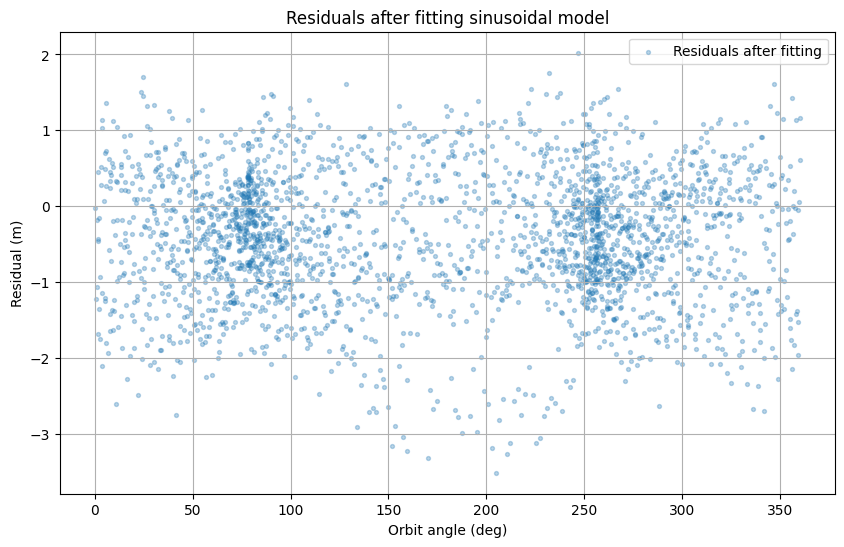

In [43]:
import numpy as np

u = np.deg2rad(merged_df['angle'].to_numpy())
y = merged_df['Normal'].to_numpy()

H = np.vstack([np.cos(u), np.sin(u)]).T

# 最小二乘
x, residual, rank, s = np.linalg.lstsq(H, y, rcond=None)
Ac_pos, As_pos = x

T = 5400  # 秒，比如 ~5400s
n = 2*np.pi / T

Ac_acc = -n**2 * Ac_pos*1e6
As_acc = -n**2 * As_pos*1e6

print(f"Ac_pos: {Ac_pos:.4f} mm, As_pos: {As_pos:.4f} mm")
print(f"Ac_acc: {Ac_acc:.4f} nm/s², As_acc: {As_acc:.4f} nm/s²")
# 计算拟合值和残差
y_fit = H @ x
residuals = y - y_fit
# 可视化残差
plt.figure(figsize=(10, 6))
plt.scatter(merged_df['angle'], residuals, s=8, alpha=0.3, label='Residuals after fitting')
plt.xlabel('Orbit angle (deg)')
plt.ylabel('Residual (m)')
plt.title('Residuals after fitting sinusoidal model')
plt.legend()
plt.grid(True)
plt.show()


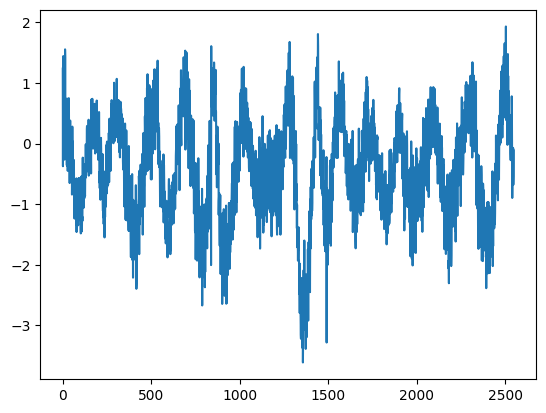

In [ ]:
plt.plot(merged_df['Normal'])
plt.show()

In [5]:
# test for satropy coordinate transformation
import numpy as np

from astropy.time import Time
from astropy.coordinates import (
    ITRS,
    GCRS,
    CartesianRepresentation,
)

import astropy.units as u

from astropy.coordinates.builtin_frames.intermediate_rotation_transforms import (
    cirs_to_itrs_mat,
    gcrs_to_cirs_mat,
)

# =========================================================
# 测试时间
# =========================================================

t = Time("2024-12-27T10:00:46", scale="utc")

# =========================================================
# ECEF坐标 (m)
# =========================================================

r_ecef = np.array([
    1113194.907,
   -4841695.486,
    3985350.233
])

# =========================================================
# 构造旋转矩阵
#
# Astropy内部:
#
# GCRS --gcrs_to_cirs--> CIRS
# CIRS --cirs_to_itrs--> ITRS(ECEF)
#
# 所以:
#
# R_gcrs_to_itrs =
#     cirs_to_itrs @ gcrs_to_cirs
#
# 取转置即可:
#
# R_itrs_to_gcrs
# =========================================================

R_gcrs_to_cirs = gcrs_to_cirs_mat(t)
R_cirs_to_itrs = cirs_to_itrs_mat(t)

R_gcrs_to_itrs = R_cirs_to_itrs @ R_gcrs_to_cirs

R_itrs_to_gcrs = R_gcrs_to_itrs.T

# =========================================================
# 输出旋转矩阵
# =========================================================

np.set_printoptions(precision=15, suppress=False)

print("\nECEF(ITRS) -> GCRS(J2000) rotation matrix:\n")
print(R_itrs_to_gcrs)

# =========================================================
# 用矩阵转换坐标
# =========================================================

r_gcrs_matrix = R_itrs_to_gcrs @ r_ecef

print("\nGCRS position from matrix:\n")
print(r_gcrs_matrix)

# =========================================================
# Astropy官方坐标变换
# =========================================================

ecef = ITRS(
    x=r_ecef[0] * u.m,
    y=r_ecef[1] * u.m,
    z=r_ecef[2] * u.m,
    obstime=t,
)

gcrs = ecef.transform_to(GCRS(obstime=t))

r_gcrs_astropy = gcrs.cartesian.xyz.to(u.m).value

print("\nGCRS position from Astropy transform:\n")
print(r_gcrs_astropy)

# =========================================================
# 对比误差
# =========================================================

diff = r_gcrs_matrix - r_gcrs_astropy

print("\nDifference (m):\n")
print(diff)

print("\n3D error norm (m):")
print(np.linalg.norm(diff))


ECEF(ITRS) -> GCRS(J2000) rotation matrix:

[[-4.026780389409410e-01  9.153384611241968e-01  2.428691307184159e-03]
 [-9.153411264303196e-01 -4.026793030128604e-01  3.450146275127412e-05]
 [ 1.009564238631595e-03 -2.209188055508196e-03  9.999970501297409e-01]]

GCRS position from matrix:

[-4870370.052030042    930834.9840057319  3997158.534338689 ]

GCRS position from Astropy transform:

[-4870370.052030042    930834.9840057318  3997158.534338689 ]

Difference (m):

[0.000000000000000e+00 1.164153218269348e-10 0.000000000000000e+00]

3D error norm (m):
1.1641532182693481e-10


In [1]:
# Merge sp3 file on time
import numpy as np
import pandas as pd 
import Sp3Tools
import os 

sp3_dir = r"D:\csu\GNSS_MIX\CSUAPPS\CSUPODSApp\BIN\outputdata\DRO"
sp3_files_ = [
    "RDOD_20241227000014_20241227075904.sp3",
    "RDOD_20241227080004_20241227095934.sp3",
    "RDOD_20241227100004_20241227155924.sp3",
    "RDOD_20241227160004_20241227175904.sp3",
    "RDOD_20241227200004_20241227235914.sp3",
    "RDOD_20241227180004_20241227195914.sp3"
]
sp3_files = [os.path.join(sp3_dir, f) for f in sp3_files_]
output_path = "RDOD_20241227_merged.sp3"

sp3, sp3_df = Sp3Tools.read_sp3(sp3_files, returnsp3=True)
sp3.write(os.path.join(sp3_dir, output_path), new_data_df=sp3_df)



{'comments': ' POD Solutions by CSUPODS                                 \n Position unit : km, Velocity unit : dm/s                 \n Clock offset unit : micro seconds                        \n EMail: junenggai_1982@126.com                            \n', 'version': 'c', 'velocity': 'V', 'time': <TimeSystem.TimeSystem object at 0x000001AAA2FFE710>, 'year': 2024, 'month': 12, 'day': 27, 'hour': 18, 'minute': 1, 'second': 0.0, 'num_epochs': 2863, 'used_data': 'ORBIT', 'coord_system': 'ITRF', 'orbit_type': 'FIT', 'agency': 'CSU', 'gps_week': 2346, 'gps_seconds': 432060.0, 'interval': 30.0, 'mjd': 60671, 'mjd_seconds': 0.0006944444467080757, 'num_sats': 1, 'file_type': 'M ', 'time_system': 'GPS'}
2863 2024-12-27 00:01:00.000


Read OBS Time :  0.36132121086120605 s
Read OBS Time :  0.27487611770629883 s
Total epochs in LTS data: 8321
Total epochs in my data: 8321
Common epochs: 8321
First3 common epochs:
2024-12-27 00:00:14 {'G04': {'CCP': 19875752.382, 'LCI': 19875755.447, 'AM': 0.796, 'LGI': None, 'AR': 1.0, 'CSI': 1.0, 'CGP': None, 'EL': 71.769, 'AZ': 76.945}, 'G08': {'CCP': 22023582.582, 'LCI': 22023580.734, 'AM': -5.681, 'LGI': None, 'AR': 1.0, 'CSI': 1.0, 'CGP': None, 'EL': 36.434, 'AZ': 48.224}, 'G27': {'CCP': 22467630.882, 'LCI': 22467636.509, 'AM': 3.641, 'LGI': None, 'AR': 1.0, 'CSI': 1.0, 'CGP': None, 'EL': 33.908, 'AZ': 91.71}, 'C11': {'CCP': None, 'LCP': 26214383.005, 'AM': -5.624, 'LGP': None, 'AR': 1.0, 'CSP': 1.0, 'CGP': None, 'EL': 6.144, 'AZ': 99.564}, 'C20': {'CCP': None, 'LCP': 24674063.239, 'AM': 103.839, 'LGP': None, 'AR': 1.0, 'CSP': 1.0, 'CGP': None, 'EL': 23.994, 'AZ': 222.131}, 'C23': {'CCP': None, 'LCP': 22141884.537, 'AM': -5.07, 'LGP': None, 'AR': 1.0, 'CSP': 1.0, 'CGP': None, 'E

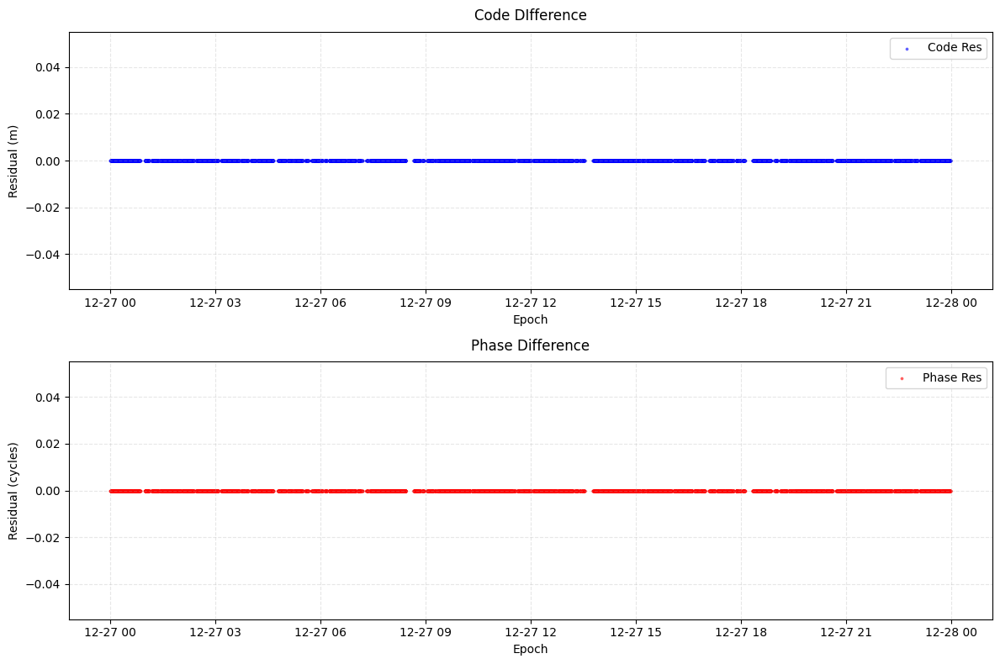

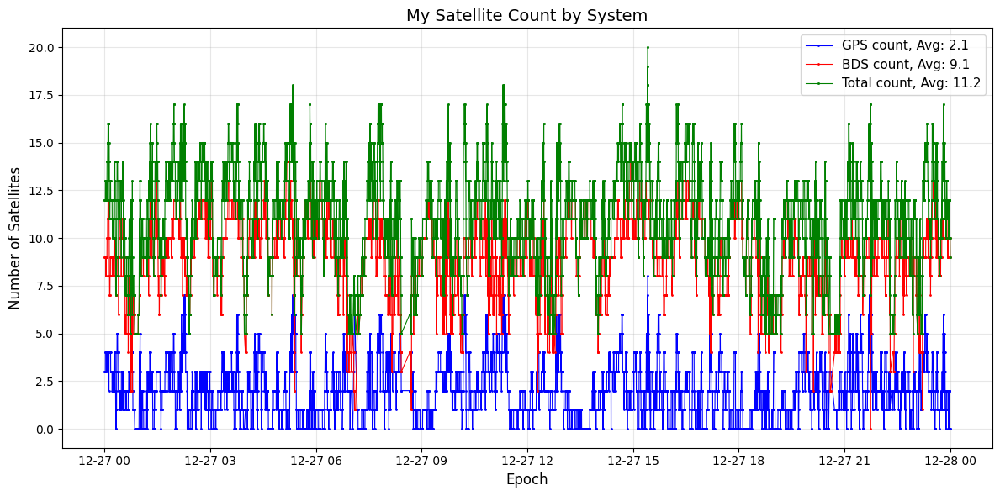

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import Rinex
import TimeSystem
import datetime

start_time = datetime.datetime(2024, 12, 27, 00, 0, 0)
end_time = datetime.datetime(2024, 12, 28, 00, 0, 0)

lts_obs_path = r"D:\csu\GNSS_MIX\CSUAPPS\CSUPODSApp\BIN\inputdata\Obs\DRO\ANT3\DRO_3_20241227_AfterPCO_Merge3MIX_10-10.rnx"
my_obs_path = r"D:\csu\GNSS_MIX\CSUAPPS\CSUPODSApp\BIN\inputdata\Obs\DRO\ANT3\my_merged_data_ant2.rnx"
lts_obs_path = r"D:\csu\GNSS_MIX\CSUAPPS\CSUPODSApp\BIN\TempData\DRO_lts\DRO_DataEditing_Obs_20241227.rnx"
my_obs_path = r"D:\csu\GNSS_MIX\CSUAPPS\CSUPODSApp\BIN\TempData\DRO\DRO_DataEditing_Obs_20241227.rnx"
lts_obs_path = r"D:\csu\GNSS_MIX\CSUAPPS\CSUPODSApp\BIN\TempData\DRO\DRO_DataEditing_Obs_20241227.rnx"
# lts_obs_path = r"D:\csu\GNSS_MIX\CSUAPPS\CSUPODSApp\BIN\inputdata\Obs\DRO\+X-Ant1_DRO_L_GNSS_20241226_H_N_305_10.rnx"
# my_obs_path = r"D:\csu\GNSS_MIX\CSUAPPS\CSUPODSApp\BIN\inputdata\Obs\DRO\-X-Ant2_DRO_L_GNSS_20241226_H_N_305_10.rnx"
lts_obs_head = Rinex.readObsHead(lts_obs_path)
lts_obs_data = Rinex.readObs(lts_obs_path, lts_obs_head)
my_obs_head = Rinex.readObsHead(my_obs_path)
my_obs_data = Rinex.readObs(my_obs_path, my_obs_head)

lts_times = []
my_times = []
for epoch in lts_obs_data.keys():
    if epoch < start_time or epoch > end_time:
        continue
    lts_times.append(epoch)
for epoch in my_obs_data.keys():
    if epoch < start_time or epoch > end_time:
        continue
    my_times.append(epoch)
lts_times = np.array(lts_times)
my_times = np.array(my_times)
common_times = np.intersect1d(lts_times, my_times)

print(f"Total epochs in LTS data: {len(lts_times)}")
print(f"Total epochs in my data: {len(my_times)}")
print(f"Common epochs: {len(common_times)}")

print("First3 common epochs:")
for epoch in common_times[:3]:
    print(epoch, lts_obs_data[epoch])
    print(epoch, my_obs_data[epoch])
code_res = {}
phase_res = {}
lts_sats_count = {}
my_sats_count = {}

for epoch in common_times:
    code_res_epoch = []
    phase_res_epoch = []
    lts_epoch = lts_obs_data[epoch]
    my_epoch = my_obs_data[epoch]

    lts_sats = set(lts_epoch.keys())
    gps_count, bds_count= 0, 0
    for sat in lts_sats:
        if sat.startswith('G'):
            gps_count += 1
        elif sat.startswith('C'):
            bds_count += 1
    lts_sats_count[epoch] = {'GPS': gps_count, 'BDS': bds_count}

    my_sats = set(my_epoch.keys())
    gps_count, bds_count= 0, 0
    for sat in my_sats:
        if sat.startswith('G'):
            gps_count += 1
        elif sat.startswith('C'):
            bds_count += 1
    my_sats_count[epoch] = {'GPS': gps_count, 'BDS': bds_count}

    common_sats = lts_sats.intersection(my_sats)
    for sat in common_sats:
        lts_obs = lts_epoch[sat]
        my_obs = my_epoch[sat]

        lts_L1 = lts_obs.get('L1C', np.nan)
        lts_L2 = lts_obs.get('L2S', np.nan)
        my_L1 = my_obs.get('L1C', np.nan)
        my_L2 = my_obs.get('L2S', np.nan)
        lts_LC = lts_obs.get('LCI', np.nan)
        my_LC = my_obs.get('LCI', np.nan)

        lts_C1 = lts_obs.get('C1C', np.nan)
        lts_P2 = lts_obs.get('C2S', np.nan)
        my_C1 = my_obs.get('C1C', np.nan)
        my_P2 = my_obs.get('C2S', np.nan)
        lts_PC = lts_obs.get('CCP', np.nan)
        my_PC = my_obs.get('CCP', np.nan)
        # print(f"Epoch: {epoch}, Sat: {sat}, LTS L1: {lts_L1}, My L1: {my_L1}, LTS L2: {lts_L2}, My L2: {my_L2}, LTS C1: {lts_C1}, My C1: {my_C1}, LTS P2: {lts_P2}, My P2: {my_P2}")
        if my_P2 is not np.nan and lts_P2 is not np.nan and my_P2 is not None and lts_P2 is not None:
            if my_P2 > 1000 and lts_P2 > 1000:
                code_res_epoch.append(my_P2 - lts_P2)
        if my_C1 is not np.nan and lts_C1 is not np.nan and my_C1 is not None and lts_C1 is not None:
            if my_C1 > 1000 and lts_C1 > 1000:
                code_res_epoch.append(my_C1 - lts_C1)
        if my_L1 is not np.nan and lts_L1 is not np.nan and my_L1 is not None and lts_L1 is not None:
            if my_L1 > 1000 and lts_L1 > 1000:
                phase_res_epoch.append(my_L1 - lts_L1)
        if my_L2 is not np.nan and lts_L2 is not np.nan and my_L2 is not None and lts_L2 is not None:
            if my_L2 > 1000 and lts_L2 > 1000:
                phase_res_epoch.append(my_L2 - lts_L2)
        if my_LC is not np.nan and lts_LC is not np.nan and my_LC is not None and lts_LC is not None:
            if my_LC > 1000 and lts_LC > 1000:
                phase_res_epoch.append(my_LC - lts_LC)
        if my_PC is not np.nan and lts_PC is not np.nan and my_PC is not None and lts_PC is not None:
            if my_PC > 1000 and lts_PC > 1000:
                code_res_epoch.append(my_PC - lts_PC)
    code_res[epoch] = code_res_epoch
    phase_res[epoch] = phase_res_epoch

# plot scatter x: epoch y: code_res and phase_res 2graphs in one figure
# 定义要绘制的数据集：名称、字典、颜色、标签
plot_configs = [
    ("Code DIfference", code_res, "blue", "Code Res", "Residual (m)"),
    ("Phase Difference", phase_res, "red", "Phase Res", "Residual (cycles)")
]

# 创建画布
plt.figure(figsize=(12, 8))  # 高度稍微加大，避免拥挤

# 循环绘制子图（代码高度复用）
for i, (title, res_dict, color, label, ylabel) in enumerate(plot_configs, 1):
    plt.subplot(2, 1, i)
    
    # 批量绘制散点（比循环 scatter 快很多）
    epochs_list = []
    res_list = []
    for epoch, res_vals in res_dict.items():
        if len(res_vals) > 0:
            epochs_list.extend([epoch] * len(res_vals))
            res_list.extend(res_vals)
    
    # 一次性绘制所有点（性能大幅提升）
    plt.scatter(epochs_list, res_list, color=color, s=3, alpha=0.5, label=label)
    
    # 样式统一设置
    plt.title(title, fontsize=12, pad=10)
    plt.xlabel("Epoch", fontsize=10)
    plt.ylabel(ylabel, fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.legend()

# 自动调整子图间距（防止标题/标签重叠）
plt.tight_layout()
plt.show()


import matplotlib.pyplot as plt

# ===================== 自动提取数据 =====================
epochs = sorted(lts_sats_count.keys())  # 按时间排序

# 提取 LTS 总卫星数
lts_total = []
lts_gps = []
lts_bds = []

# 提取 My 总卫星数
my_total = []
my_gps = []
my_bds = []

for epoch in epochs:
    # LTS
    gps = lts_sats_count[epoch]['GPS']
    bds = lts_sats_count[epoch]['BDS']
    lts_gps.append(gps)
    lts_bds.append(bds)
    lts_total.append(gps + bds)
    
    # My
    gps_my = my_sats_count[epoch]['GPS']
    bds_my = my_sats_count[epoch]['BDS']
    my_gps.append(gps_my)
    my_bds.append(bds_my)
    my_total.append(gps_my + bds_my)

# ===================== 绘图 =====================
def plot_num(epochs, lts_data, my_data, title, ylabel, label1='LTS', label2='My'):
    plt.figure(figsize=(12, 6))
    lts_avg = np.mean(lts_data)
    my_avg = np.mean(my_data)
    plt.plot(epochs, lts_data, 'o-', label=f'{label1} count, Avg: {lts_avg:.1f}', color='blue', linewidth=0.8, markersize=1)
    plt.plot(epochs, my_data, 's-', label=f'{label2} count, Avg: {my_avg:.1f}', color='red', linewidth=0.8, markersize=1)

    plt.title(title, fontsize=14)
    plt.xlabel('Epoch', fontsize=12)
    plt.ylabel(ylabel, fontsize=12)
    plt.legend(fontsize=11)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

def plot_num_sys(sat_count, sys_list, title):
    colors = ['blue', 'red', 'green', 'orange', 'purple', 'cyan']  # 可扩展颜色列表
    epochs = sorted(sat_count.keys())
    plt.figure(figsize=(12, 6))
    for sys in sys_list:
        data = [sat_count[epoch][sys] for epoch in epochs]
        avg = np.mean(data)
        plt.plot(epochs, data, 'o-', label=f'{sys} count, Avg: {avg:.1f}', linewidth=0.8, markersize=1, color=colors[sys_list.index(sys)])
    data = []
    for epoch in epochs:
        all_count = sum(sat_count[epoch][sys] for sys in sys_list)
        data.append(all_count)
    plt.plot(epochs, data, 's-', label=f'Total count, Avg: {np.mean(data):.1f}', color = colors[len(sys_list)], linewidth=0.8, markersize=1)

    plt.title(title, fontsize=14)
    plt.xlabel('Epoch', fontsize=12)
    plt.ylabel('Number of Satellites', fontsize=12)
    plt.legend(fontsize=11)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# plot_num(epochs, lts_total, my_total, 'GPS + BDS', 'Number of Satellites')
# plot_num(epochs, lts_gps, my_gps, 'GPS', 'Number of Satellites')
# plot_num(epochs, lts_bds, my_bds, 'BDS', 'Number of Satellites')

plot_num_sys(my_sats_count, ['GPS', 'BDS'], 'My Satellite Count by System')

# plt.figure(figsize=(12, 6))
# lts_avg = np.mean(lts_total)
# my_avg = np.mean(my_total)
# plt.plot(epochs, lts_total, 'o-', label=f'LTS count, Avg: {lts_avg:.1f}', color='blue', linewidth=0.8, markersize=1)
# plt.plot(epochs, my_total, 's-', label=f'My count, Avg: {my_avg:.1f}', color='red', linewidth=0.8, markersize=1)

# plt.title('GPS + BDS', fontsize=14)
# plt.xlabel('Epoch', fontsize=12)
# plt.ylabel('Number of Satellites', fontsize=12)
# plt.legend(fontsize=11)
# plt.grid(True, alpha=0.3)
# plt.tight_layout()
# plt.show()


# plt.figure(figsize=(12, 6))
# lts_avg = np.mean(lts_gps)
# my_avg = np.mean(my_gps)
# plt.plot(epochs, lts_gps, 'o-', label=f'LTS count, Avg: {lts_avg:.1f}', color='blue', linewidth=0.8, markersize=1)
# plt.plot(epochs, my_gps, 's-', label=f'My count, Avg: {my_avg:.1f}', color='red', linewidth=0.8, markersize=1)

# plt.title('GPS', fontsize=14)
# plt.xlabel('Epoch', fontsize=12)
# plt.ylabel('Number of Satellites', fontsize=12)
# plt.legend(fontsize=11)
# plt.grid(True, alpha=0.3)
# plt.tight_layout()
# plt.show()

# plt.figure(figsize=(12, 6))
# lts_avg = np.mean(lts_bds)
# my_avg = np.mean(my_bds)
# plt.plot(epochs, lts_bds, 'o-', label=f'LTS count, Avg: {lts_avg:.1f}', color='blue', linewidth=0.8, markersize=1)
# plt.plot(epochs, my_bds, 's-', label=f'My count, Avg: {my_avg:.1f}', color='red', linewidth=0.8, markersize=1)

# plt.title('BDS', fontsize=14)
# plt.xlabel('Epoch', fontsize=12)
# plt.ylabel('Number of Satellites', fontsize=12)
# plt.legend(fontsize=11)
# plt.grid(True, alpha=0.3)
# plt.tight_layout()
# plt.show()
